# Point Cloud Classification with PointNet

In [1]:
#This is an implementation of PointNet: Deep Learning on Point Sets for 3D Classification and Segmentation using PyTorch.
#The data augmentation and model training code for the baseline PointNet is refered from https://github.com/nikitakaraevv/pointnet/blob/master/nbs/PointNetClass.ipynb
#But explaination is provided to show the understanding of it.
#While the code in modification session is wrote from scratch.
import os
import glob
import trimesh
from matplotlib import pyplot as plt
from PIL import Image
import numpy as np
import math
import random
import torch.nn as nn
import torch
import torch.nn.functional as F
import scipy.spatial.distance
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
from torch.utils.tensorboard import SummaryWriter
import time
import plotly.graph_objects as go

In [2]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"

# Dataset Analysis

In [36]:
CLASS_MAP={}
class_map=[]
with open("shape_names.txt") as f:
    for i,line in enumerate(f):
        key = i 
        val = line.split()
        CLASS_MAP[int(key)] = val
        class_map.append(val)

print (CLASS_MAP)


{0: ['airplane'], 1: ['bathtub'], 2: ['bed'], 3: ['bench'], 4: ['bookshelf'], 5: ['bottle'], 6: ['bowl'], 7: ['car'], 8: ['chair'], 9: ['cone'], 10: ['cup'], 11: ['curtain'], 12: ['desk'], 13: ['door'], 14: ['dresser'], 15: ['flower_pot'], 16: ['glass_box'], 17: ['guitar'], 18: ['keyboard'], 19: ['lamp'], 20: ['laptop'], 21: ['mantel'], 22: ['monitor'], 23: ['night_stand'], 24: ['person'], 25: ['piano'], 26: ['plant'], 27: ['radio'], 28: ['range_hood'], 29: ['sink'], 30: ['sofa'], 31: ['stairs'], 32: ['stool'], 33: ['table'], 34: ['tent'], 35: ['toilet'], 36: ['tv_stand'], 37: ['vase'], 38: ['wardrobe'], 39: ['xbox']}


### Visualize Point Cloud Dataset

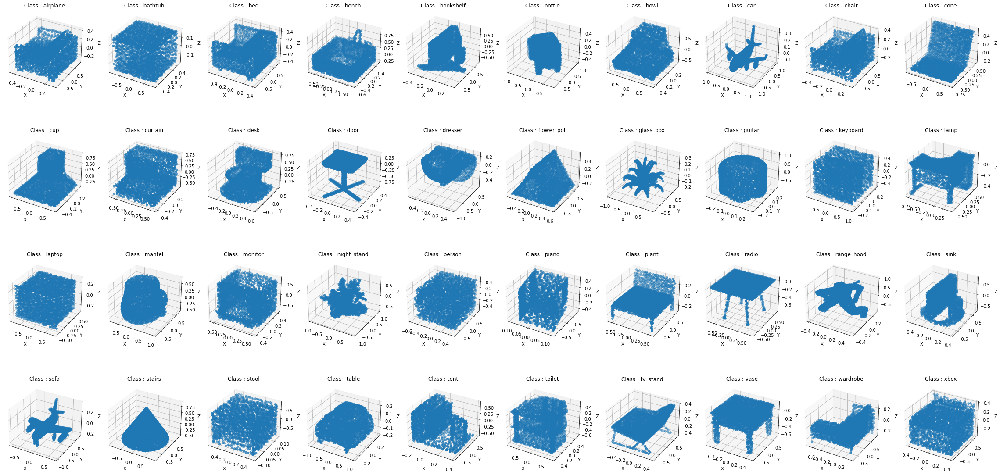

In [35]:
#Before diving into performing deep learning tasks on point cloud data, it is important to understand how the data in question looks like. 
#Thus, I plot 3D projection of point clouds to visualize how they represent common objects(in the 40 classes).
train_points = np.load('train/coors.npy')
test_points = np.load('test/coors.npy')
train_labels= np.load('train/labels.npy')
test_labels= np.load('test/labels.npy')

#1st index of each class label
unique_cloud_idx1 = [(train_labels.tolist()).index(i) for i in range(40)]
f, axs = plt.subplots(4,10,figsize=(40,20))
for i,idx in enumerate(unique_cloud_idx1):
    cloud_id = train_labels[idx]
    # coordinates
    x = train_points[cloud_id, :,0]
    y = train_points[cloud_id,:, 2]
    z = train_points[cloud_id,:, 1]
    ax = plt.subplot(4,10,i+1,projection='3d')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    plt.title('Class : '+ (CLASS_MAP[i])[0])
    ax.scatter(x, y, z, cmap=plt.hot())
    # ax.set_axis_off()

plt.show()

### Is it a balanced dataset?

In [4]:
#Here, I check for the occurrence of each class to determine whether it is a balanced dataset
import pandas as pd
import collections
from collections import Counter
from IPython.display import display, HTML

occurrences = collections.Counter(train_labels.tolist())
df = pd.DataFrame.from_records(list(dict(occurrences).items()), columns=['Class_label','count'])
df = df.sort_values(by=['Class_label'])
df['Class_name']=class_map 
display(HTML(df.to_html(index=False)))

Class_label,count,Class_name
0,625,[airplane]
1,106,[bathtub]
2,515,[bed]
3,173,[bench]
4,572,[bookshelf]
5,335,[bottle]
6,64,[bowl]
7,197,[car]
8,889,[chair]
9,167,[cone]


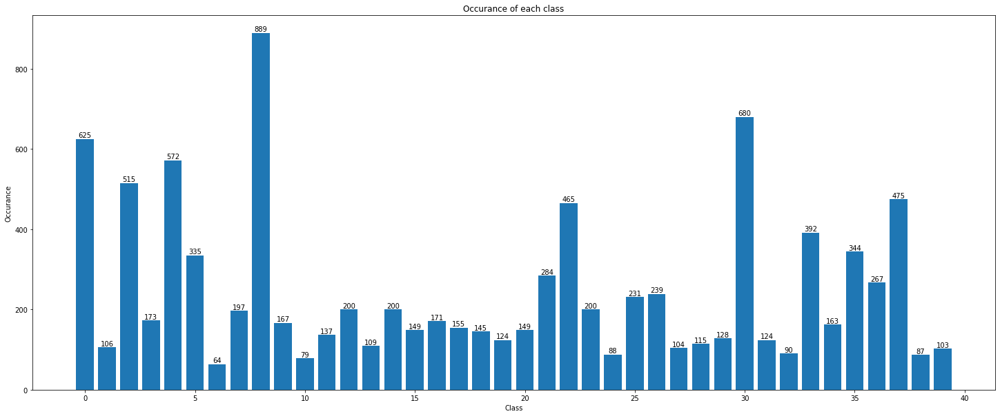

In [41]:
class_list = df['Class_label'].tolist()
freq_list = df['count'].tolist()

#Plot the bar graph of occurrence of each class
plt.figure(figsize=(25,10)) 
plot = plt.bar(class_list, freq_list)
 
# Add the data value on head of the bar
for value in plot:
    height = value.get_height()
    plt.text(value.get_x() + value.get_width()/2.,1.002*height,'%d' % int(height), ha='center', va='bottom')
 
plt.title("Occurance of each class")
plt.xlabel("Class")
plt.ylabel("Occurance")
 
# Display the graph on the screen
plt.show()

As shown in the graph above, we can see that the dataset is an imbalanced dataset where the target classes have uneven distribution of observations; with the Class label 8 has the highest number of observations(889 point clouds) while the Class label 6 has the low number of observations(64 point clouds).

# Data Augmentation

(2048, 3)


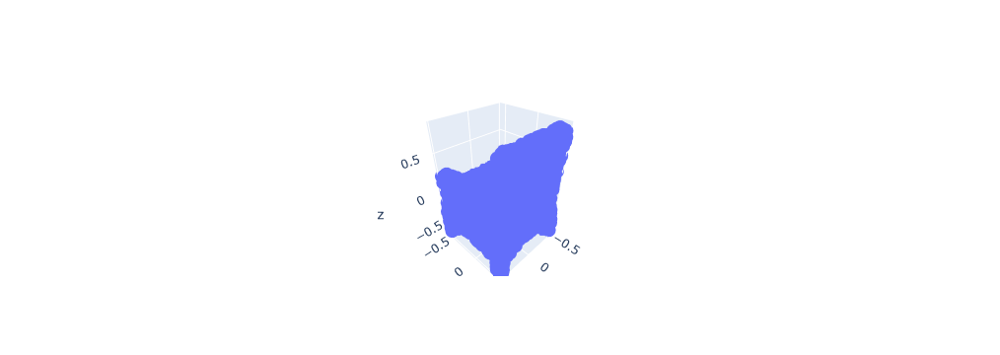

In [8]:
# Normalize the pointcloud to a unit sphere
"""
    Pointcloud data will now have zero mean and will be centered around the origin, normalized to a unit sphere.
    pointcloud is of shape (n,3) where n is the number of points.
    
    This function will have the same effect as normalize the points coordinates to between the value [-1,1] which has been done in the given dataset.
    Thus, this function is not use in the experiments done and is just put here for the preprocess of external data(in case there is).
"""
class Normalize(object):
    def __call__(self, pointcloud):
        assert len(pointcloud.shape)==2
        
        norm_pointcloud = pointcloud - np.mean(pointcloud, axis=0) 
        norm_pointcloud /= np.max(np.linalg.norm(norm_pointcloud, axis=1))

        return  norm_pointcloud
    
normalize_pointcloud = Normalize()
pointcloud = normalize_pointcloud(train_points[1023]) # Normalize the pointcloud to a unit sphere
print(pointcloud.shape) 
fig=go.Figure(data=[go.Scatter3d(x=pointcloud[:,0],y=pointcloud[:,2],z=pointcloud[:,1],mode='markers')])
fig.show()

(2048, 3)


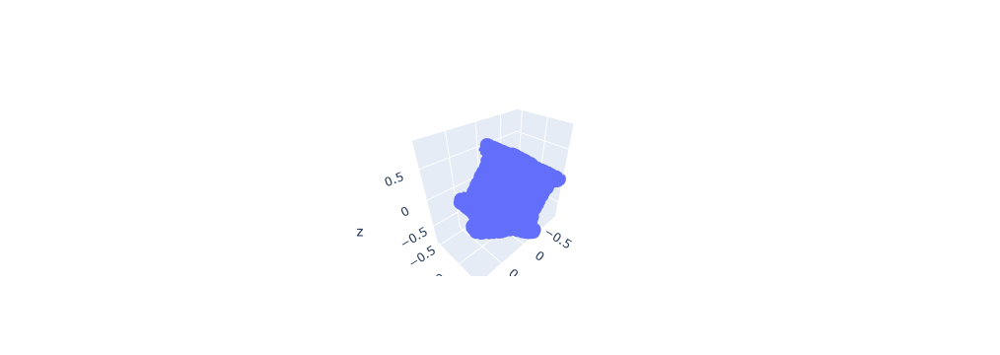

In [9]:
#Rotation
#Rotate the pointcloud by a random degree,every time we run this cell, we will notice a different output
"""
    Function to randomly rotate a pointcloud (object) by an angle theta along the z axis, this is useful to make a deep learning model view invariant.
    Explanation can be found at https://en.wikipedia.org/wiki/Rotation_matrix #Basic_rotations.
    pointcloud is of shape (n,3) where n is the number of points
"""
class RandRotation_z(object):
    def __call__(self, pointcloud):
        assert len(pointcloud.shape)==2

        theta = random.random() * 2. * math.pi
        rot_matrix = np.array([[ math.cos(theta), -math.sin(theta),    0],
                               [ math.sin(theta),  math.cos(theta),    0],
                               [0,                             0,      1]])
        
        rot_pointcloud = rot_matrix.dot(pointcloud.T).T
        return  rot_pointcloud
    
rot_pointcloud = RandRotation_z()(train_points[1023])
print(rot_pointcloud.shape) 
fig=go.Figure(data=[go.Scatter3d(x=rot_pointcloud[:,0],y=rot_pointcloud[:,2],z=rot_pointcloud[:,1],mode='markers')])
fig.show()



(2048, 3)


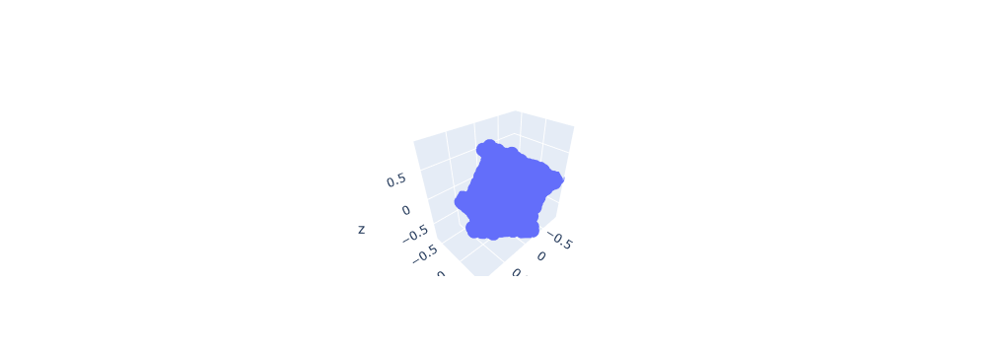

In [10]:
#Adding noise
"""
    To make a deep learning model robust to variances in distributions of input data, a slight noise is added to the original pointcloud.
    Jitter the position of each points by a Gaussian noise with zero mean and 0.02 standard deviation.
"""
class RandomNoise(object):
    def __call__(self, pointcloud):
        assert len(pointcloud.shape)==2

        noise = np.random.normal(0, 0.02, (pointcloud.shape))
    
        noisy_pointcloud = pointcloud + noise
        return  noisy_pointcloud

    
noisy_rot_pointcloud = RandomNoise()(rot_pointcloud)#(train_points[1023]) 
print(noisy_rot_pointcloud.shape) 
fig=go.Figure(data=[go.Scatter3d(x=noisy_rot_pointcloud[:,0],y=noisy_rot_pointcloud[:,2],z=noisy_rot_pointcloud[:,1],mode='markers')])
fig.show()


In [11]:
#convert the data from numpy to tensor
class ToTensor(object):
    def __call__(self, pointcloud):
        assert len(pointcloud.shape)==2

        return torch.from_numpy(pointcloud)

In [12]:
train_transforms = transforms.Compose([
                    RandRotation_z(),
                    RandomNoise(),
                    ToTensor()
                    ])
test_transforms = transforms.Compose([
                    ToTensor()
                    ])

In [13]:
#dataset
class PointCloudData(Dataset):
    def __init__(self, dataset_dir, transform=None):
        self.points = np.load(dataset_dir+'coors.npy')
        self.labels= np.load(dataset_dir+'labels.npy')
        self.transforms = transform 
    
    def __len__(self):
        return len(self.points)

    def __getitem__(self, idx):
        pointcloud = self.transforms(self.points[idx])
        return {'pointcloud': pointcloud, 
                'category': self.labels[idx]}

In [14]:
train_ds = PointCloudData('train/', transform=train_transforms)
test_ds = PointCloudData('test/',transform=test_transforms)

In [15]:
train_loader = DataLoader(dataset=train_ds, batch_size=32, shuffle=True)
test_loader = DataLoader(dataset=test_ds, batch_size=32)

# Model
### Baseline


In [16]:
import torch
import torch.nn as nn
import numpy as np
import torch.nn.functional as F

class Tnet(nn.Module):
    """
        TNet module to predict a transformation matrix.
        It has Conv1d in “downsample part ” and fully connected layer in “upsample part”.
    """
    def __init__(self, k=3):
        super().__init__()
        self.k=k
        self.conv1 = nn.Conv1d(k,64,1)
        self.conv2 = nn.Conv1d(64,128,1)
        self.conv3 = nn.Conv1d(128,1024,1)
        self.fc1 = nn.Linear(1024,512)
        self.fc2 = nn.Linear(512,256)
        self.fc3 = nn.Linear(256,k*k)
        self.bn1 = nn.BatchNorm1d(64)
        self.bn2 = nn.BatchNorm1d(128)
        self.bn3 = nn.BatchNorm1d(1024)
        self.bn4 = nn.BatchNorm1d(512)
        self.bn5 = nn.BatchNorm1d(256)
       

    def forward(self, input):
        # input.shape == (bs,n,3)
        bs = input.size(0)
        #print('input : ',input.shape)
        x = F.relu(self.bn1(self.conv1(input)))
        #print('after conv1 : ',x.shape)
        x = F.relu(self.bn2(self.conv2(x)))
        #print('after conv2 : ',x.shape)
        x = F.relu(self.bn3(self.conv3(x)))
        #print('after conv3 : ',x.shape)
        pool = nn.MaxPool1d(x.size(-1))(x)
        #print('after pool : ',pool.shape)
        flat = nn.Flatten(1)(pool)
        #print('after flat : ',flat.shape)
        x = F.relu(self.bn4(self.fc1(flat)))
        #print('after fc1 : ',x.shape)
        x = F.relu(self.bn5(self.fc2(x)))
        #print('after fc2 : ',x.shape)

        
        #Here, I initialize an identity matrix by default because we want to start training with no transformations at all. 
        #So, we just add an identity matrix to the output
        init = torch.eye(self.k, requires_grad=True).repeat(bs,1,1)#initialize as identity
        if x.is_cuda:
            init=init.cuda()   
        matrix = self.fc3(x).view(-1,self.k,self.k) + init
        return matrix


class Transform(nn.Module):
    def __init__(self):
        super().__init__()
        self.input_transform = Tnet(k=3)
        self.feature_transform = Tnet(k=64)
        self.conv1 = nn.Conv1d(3,64,1)
        self.conv2 = nn.Conv1d(64,128,1)
        self.conv3 = nn.Conv1d(128,1024,1)
        self.bn1 = nn.BatchNorm1d(64)
        self.bn2 = nn.BatchNorm1d(128)
        self.bn3 = nn.BatchNorm1d(1024)
       
    def forward(self, input):
        matrix3x3 = self.input_transform(input) # here, input is of shape (bs,3,n)
        input = torch.transpose(input,1,2)# input is now (bs,n,3)
        # apply input transform (batch matrix multiplication) to ensure invariance to transformations
        # Here, I apply the 3x3 transformation matrix,matrix3x3 predicted by T-Net to coordinates of input points,input 
        x = torch.bmm(input, matrix3x3).transpose(1,2)
        x = F.relu(self.bn1(self.conv1(x)))
        
        # similarly for the feature space
        # we apply feature transform
        matrix64x64 = self.feature_transform(x)
        x = torch.transpose(x,1,2)
        x = torch.bmm(x, matrix64x64).transpose(1,2)
        x = F.relu(self.bn2(self.conv2(x)))
        x = self.bn3(self.conv3(x))
        x = nn.MaxPool1d(x.size(-1))(x)
        output = nn.Flatten(1)(x)
        return output, matrix3x3, matrix64x64

class PointNet(nn.Module):
    '''PointNet architecture,wrapped the transforms module with the last MLP and LogSoftmax at the output'''
    def __init__(self, classes = 40):
        super().__init__()
        self.transform = Transform()
        self.fc1 = nn.Linear(1024, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, classes)    
        self.bn1 = nn.BatchNorm1d(512)
        self.bn2 = nn.BatchNorm1d(256)
        self.dropout = nn.Dropout(p=0.3)
        self.logsoftmax = nn.LogSoftmax(dim=1)

    def forward(self, input):
        x, matrix3x3, matrix64x64 = self.transform(input)
        x = F.relu(self.bn1(self.fc1(x)))
        x = F.relu(self.bn2(self.dropout(self.fc2(x))))
        output = self.logsoftmax(self.fc3(x))
        return output, matrix3x3, matrix64x64

In [17]:
#The loss function is implemented based on the PointNet paper.
#As we used LogSoftmax for stability, we should apply NLLLoss instead of CrossEntropyLoss.
#Also, we will add two regularization terms in order transformations matrices to be close to orthogonal ( AAᵀ = I )
def pointnetloss(outputs, labels, m3x3, m64x64, alpha = 0.0001):
    criterion = torch.nn.NLLLoss()
    bs=outputs.size(0)
    id3x3 = torch.eye(3, requires_grad=True).repeat(bs,1,1)
    id64x64 = torch.eye(64, requires_grad=True).repeat(bs,1,1)
    if outputs.is_cuda:
        id3x3=id3x3.cuda()
        id64x64=id64x64.cuda()
    diff3x3 = id3x3-torch.bmm(m3x3,m3x3.transpose(1,2))
    diff64x64 = id64x64-torch.bmm(m64x64,m64x64.transpose(1,2))
    return criterion(outputs, labels) + alpha * (torch.norm(diff3x3)+torch.norm(diff64x64)) / float(bs)

In [18]:
class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0, path='checkpoint.pt', trace_func=print):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
                            Default: 7
            verbose (bool): If True, prints a message for each validation loss improvement. 
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
            path (str): Path for the checkpoint to be saved to.
                            Default: 'checkpoint.pt'
            trace_func (function): trace print function.
                            Default: print            
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            self.trace_func(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss

## Training (baseline)

In [19]:
bs=32
epochs = 300
lr = 0.001
save_every = 10
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [20]:
model = PointNet()
model.to(device)

PointNet(
  (transform): Transform(
    (input_transform): Tnet(
      (conv1): Conv1d(3, 64, kernel_size=(1,), stride=(1,))
      (conv2): Conv1d(64, 128, kernel_size=(1,), stride=(1,))
      (conv3): Conv1d(128, 1024, kernel_size=(1,), stride=(1,))
      (fc1): Linear(in_features=1024, out_features=512, bias=True)
      (fc2): Linear(in_features=512, out_features=256, bias=True)
      (fc3): Linear(in_features=256, out_features=9, bias=True)
      (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn3): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn4): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn5): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (feature_transform): Tnet(
      (conv1): Conv1d(64, 64, kernel_size=(1,

In [21]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=20,gamma=0.5)
early_stopping = EarlyStopping(patience=20, verbose=True)
writer = SummaryWriter('runs/experiment_baseline')

In [22]:
def train(train_loader, test_loader=None,  epochs=15):
    train_losses = []
    test_losses = []
    train_accs = []
    test_accs = []
    
    for epoch in range(epochs): 
        model.train()
        running_loss = 0.0
        av_tr_loss = 0
        train_acc = 0
        for i, data in enumerate(train_loader, 0):
            inputs, labels = data['pointcloud'].to(device).float(), data['category'].type(torch.LongTensor).to(device)
            optimizer.zero_grad()
            outputs, m3x3, m64x64 = model(inputs.transpose(1,2))

            loss = pointnetloss(outputs, labels, m3x3, m64x64)
            loss.backward()
            optimizer.step()
            # scheduler.step()
            
            av_tr_loss += loss.item()
            
            # print statistics
            running_loss += loss.item()
            acc = torch.sum(torch.argmax(outputs.data,dim = 1) == labels)
            train_acc += acc
            if i % 100 == 9:    # print every 100 mini-batches
                    print('[Epoch: %d, Batch: %4d / %4d], loss: %.3f, accuracy: %.2f' %
                        (epoch + 1, i + 1, len(train_loader), running_loss/ 100, 100*acc.item()/labels.size()[0]))
                    running_loss = 0.0

        model.eval()
        correct = total = 0
        av_test_loss = 0
        test_acc = 0
        # validation
        if test_loader:
            with torch.no_grad():
                for data in test_loader:
                    inputs, labels = data['pointcloud'].to(device).float(), data['category'].type(torch.LongTensor).to(device)
                    outputs, m3x3, m64x64 = model(inputs.transpose(1,2))
                    loss_test = pointnetloss(outputs, labels, m3x3, m64x64)
                    av_test_loss += loss_test.item()
                    test_acc += torch.sum(torch.argmax(outputs.data,dim = 1) == labels)
                    _, predicted = torch.max(outputs.data, 1)
                    total += labels.size(0)
                    correct += (predicted == labels).sum().item()
            val_acc = 100. * correct / total
            print('Test accuracy: %d %%' % val_acc)

        writer.add_scalar('Test Loss',av_test_loss/(len(test_ds)//bs),epoch)
        writer.add_scalar('Test acc',test_acc.item()/len(test_ds),epoch)
        writer.add_scalar('Train Loss',av_tr_loss/(len(train_ds)//bs),epoch)
        writer.add_scalar('Train acc',train_acc.item()/len(train_ds),epoch)
        train_losses.append(av_tr_loss/(len(train_ds)//bs))
        test_losses.append(av_test_loss/(len(test_ds)//bs))
        train_accs.append(train_acc.item()/len(train_ds))
        test_accs.append(test_acc.item()/len(test_ds))
        print("TESTING")       
        print("Epoch [{}/{}] --> Testing Loss:{:.3f}, Testing Accuracy:{:.2f}\n".format(epoch+1,epochs,av_test_loss/(len(test_ds)//bs), 100*test_acc.item()/len(test_ds)))
        print("TRAINING")
        print("Epoch [{}/{}] --> Training Loss:{:.3f}, Training Accuracy:{:.2f}\n".format(epoch+1,epochs,av_tr_loss/(len(train_ds)//bs), 100*train_acc.item()/len(train_ds)))
        
        # save the model
        if (epoch+1)%save_every == 0:
            print("SAVING MODEL CHECKPOINT")
            torch.save(model.state_dict(), "baseline_ckpt/"+"save_baseline_"+str(epoch)+".pth")
        
        #end of one epoch
        mean_loss = (av_test_loss/(len(test_ds)//bs))
        early_stopping(mean_loss, model)
        
        if early_stopping.early_stop:
            print("Early stopping")
            torch.save(model.state_dict(), 'baseline_early_stop_model.pth')
            break #early stopping applied

    writer.flush()
    return train_losses,test_losses,train_accs,test_accs   

In [27]:
train_losses,test_losses,train_accs,test_accs=train(train_loader, test_loader, 250)

[Epoch: 1, Batch:   10 /  308], loss: 0.361, accuracy: 18.75
[Epoch: 1, Batch:  110 /  308], loss: 2.845, accuracy: 31.25
[Epoch: 1, Batch:  210 /  308], loss: 2.376, accuracy: 34.38
Test accuracy: 32 %
TESTING
Epoch [1/250] --> Testing Loss:2.419, Testing Accuracy:32.78

TRAINING
Epoch [1/250] --> Training Loss:2.526, Training Accuracy:34.00

Validation loss decreased (inf --> 2.418552).  Saving model ...
[Epoch: 2, Batch:   10 /  308], loss: 0.199, accuracy: 34.38
[Epoch: 2, Batch:  110 /  308], loss: 2.054, accuracy: 46.88
[Epoch: 2, Batch:  210 /  308], loss: 1.925, accuracy: 28.12
Test accuracy: 42 %
TESTING
Epoch [2/250] --> Testing Loss:2.211, Testing Accuracy:42.95

TRAINING
Epoch [2/250] --> Training Loss:1.936, Training Accuracy:46.84

Validation loss decreased (2.418552 --> 2.210952).  Saving model ...
[Epoch: 3, Batch:   10 /  308], loss: 0.172, accuracy: 37.50
[Epoch: 3, Batch:  110 /  308], loss: 1.728, accuracy: 37.50
[Epoch: 3, Batch:  210 /  308], loss: 1.724, accuracy

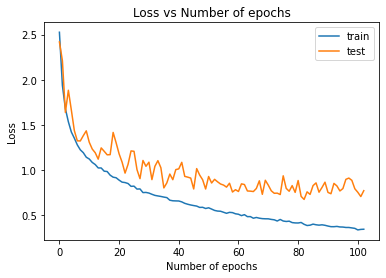

In [28]:
plt.plot(train_losses,label = 'train')
plt.plot(test_losses,label = 'test')
plt.legend()
plt.xlabel("Number of epochs")
plt.ylabel("Loss")
plt.title("Loss vs Number of epochs")
plt.show()

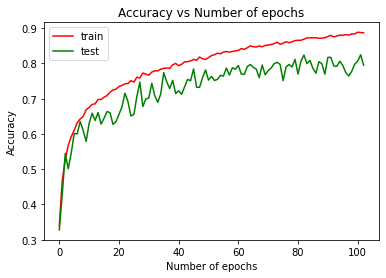

In [29]:
plt.plot(train_accs,label = 'train', color= 'red')
plt.plot(test_accs,label = 'test', color = 'green')
plt.legend()
plt.xlabel("Number of epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Number of epochs")
plt.show()

## Inference (baseline)

In [23]:
from sklearn.metrics import confusion_matrix

In [49]:
pointnet = PointNet()
pointnet.load_state_dict(torch.load('baseline_early_stop_model.pth'))
pointnet.eval();

In [36]:
all_preds = []
all_labels = []
with torch.no_grad():
    for i, data in enumerate(test_loader):
        print('Batch [%4d / %4d]' % (i+1, len(test_loader)))
                   
        inputs, labels = data['pointcloud'].float(), data['category']
        outputs, __, __ = pointnet(inputs.transpose(1,2))
        _, preds = torch.max(outputs.data, 1)
        all_preds += list(preds.numpy())
        all_labels += list(labels.numpy())

Batch [   1 /  617]
Batch [   2 /  617]
Batch [   3 /  617]
Batch [   4 /  617]
Batch [   5 /  617]
Batch [   6 /  617]
Batch [   7 /  617]
Batch [   8 /  617]
Batch [   9 /  617]
Batch [  10 /  617]
Batch [  11 /  617]
Batch [  12 /  617]
Batch [  13 /  617]
Batch [  14 /  617]
Batch [  15 /  617]
Batch [  16 /  617]
Batch [  17 /  617]
Batch [  18 /  617]
Batch [  19 /  617]
Batch [  20 /  617]
Batch [  21 /  617]
Batch [  22 /  617]
Batch [  23 /  617]
Batch [  24 /  617]
Batch [  25 /  617]
Batch [  26 /  617]
Batch [  27 /  617]
Batch [  28 /  617]
Batch [  29 /  617]
Batch [  30 /  617]
Batch [  31 /  617]
Batch [  32 /  617]
Batch [  33 /  617]
Batch [  34 /  617]
Batch [  35 /  617]
Batch [  36 /  617]
Batch [  37 /  617]
Batch [  38 /  617]
Batch [  39 /  617]
Batch [  40 /  617]
Batch [  41 /  617]
Batch [  42 /  617]
Batch [  43 /  617]
Batch [  44 /  617]
Batch [  45 /  617]
Batch [  46 /  617]
Batch [  47 /  617]
Batch [  48 /  617]
Batch [  49 /  617]
Batch [  50 /  617]


In [48]:
cm = confusion_matrix(all_labels, all_preds);
cm

array([[83,  0,  0, ...,  0,  0,  0],
       [ 1, 38,  0, ...,  0,  0,  0],
       [ 0,  1, 79, ...,  0,  0,  0],
       ...,
       [ 0,  1,  0, ..., 51,  2,  0],
       [ 0,  0,  0, ...,  0,  9,  3],
       [ 0,  1,  2, ...,  0,  1,  9]])

In [49]:
import itertools
import numpy as np
import matplotlib.pyplot as plt

# function from https://deeplizard.com/learn/video/0LhiS6yu2qQ
def plot_confusion_matrix(cm, classes, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

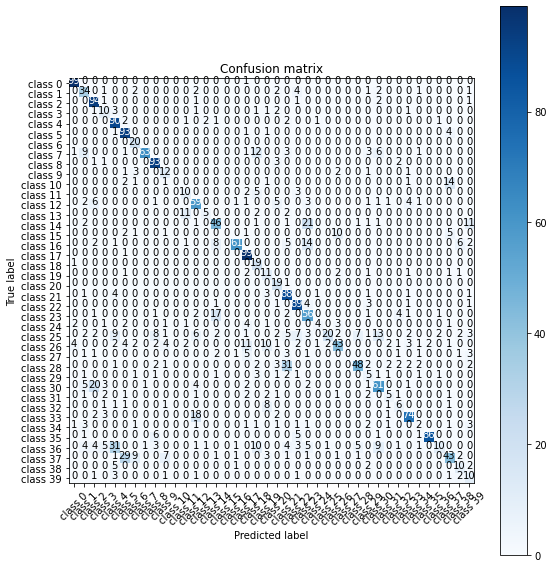

In [42]:
plt.figure(figsize=(8,8))
plot_confusion_matrix(cm, ['class '+str(s) for s in list(range(40))])

In [48]:
from sklearn.metrics import classification_report
# classification report for precision, recall f1-score and accuracy
matrix = classification_report(all_labels, all_preds)
print('Classification report : \n',matrix)

Classification report : 
               precision    recall  f1-score   support

           0       0.93      0.99      0.96       100
           1       0.41      0.82      0.54        50
           2       0.87      0.81      0.84       100
           3       0.37      0.75      0.49        20
           4       0.72      0.82      0.77       100
           5       0.68      0.89      0.77       100
           6       0.51      0.95      0.67        20
           7       0.84      0.76      0.80       100
           8       0.82      0.94      0.87       100
           9       0.33      0.70      0.45        20
          10       0.00      0.00      0.00        20
          11       0.21      0.20      0.21        20
          12       0.81      0.41      0.54        86
          13       0.50      0.80      0.62        20
          14       0.54      0.59      0.57        86
          15       0.00      0.00      0.00        20
          16       0.89      0.54      0.67       100
 

As we can see from the support column (which tells how many of each class there were) the data distribution on all the 40 classes are imbalanced. Thus, we should look at the F1 score on the performance of the model. In classification report, the accuracy for a general report of model performance with balanced datasets, and the exact the number of that belongs to accuracy is accuracy in column of f1-score. While for our case which is an imbalanced data,only macro F1 score did a good job of describing overall model performance (caring equally about all 40 classes).

# Modification
In this notebook, I will only show the full training and inference pipeline(on model training and inference; the data augmentation and data loading are the same as baseline) for the modification on :
* baseline(U-Net input transform and U-Net feature transform)  
* baseline(U-Net input transform and TNet feature transform)
* baseline(TNet input transform and U-Net feature transform)

and also the modification part just on:
* Weighted Cross Entropy Loss
* Resampling data(Undersampling)
* Data Augmentation(Shuffle)

But the full training and inference pipeline can be find in their respective jupyter notebook.

## 1. Change T-Net(in input transform and feature transform) to U-Net
 
### Model 


In [25]:
import gc

class conbr_block(nn.Module):
    '''Conv1d block'''
    def __init__(self, in_layer, out_layer):
        super(conbr_block, self).__init__()

        self.conv1 = nn.Conv1d(in_layer, out_layer, 1)
        self.bn = nn.BatchNorm1d(out_layer)
        self.relu = nn.ReLU()
    
    def forward(self,x):
        x = self.conv1(x)
        x = self.bn(x)
        out = self.relu(x)
        
        return out       

class UNET_1D(nn.Module):
    '''1D Unet architecture'''
    def __init__(self ,input_dim):
        super(UNET_1D, self).__init__()
        self.input_dim = input_dim
        
        self.conv1 = conbr_block(input_dim,64) 
        self.conv2 = conbr_block(64,128) 
        self.conv3 = conbr_block(128,256) 
        self.conv4 = conbr_block(256,512) 
        self.conv5 = conbr_block(512,1024) 

        self.up6 = nn.ConvTranspose1d(1024,512,kernel_size=1)#nn.Upsample() 
        self.conv6 = conbr_block(1024,512) 
        self.up7 = nn.ConvTranspose1d(512,256,kernel_size=1)#nn.Upsample() 
        self.conv7 = conbr_block(512,256) 
        self.up8 = nn.ConvTranspose1d(256,128,kernel_size=1)#nn.Upsample() 
        self.conv8 = conbr_block(256,128) 
        self.up9 = nn.ConvTranspose1d(128,64,kernel_size=1)#nn.Upsample() 
        self.conv9 = conbr_block(128,64) 
        
        #input_dim = k 
        self.outcov = nn.Conv1d(64, input_dim*input_dim , kernel_size=1)

            
    def forward(self, x):               
        #############Encoder#####################
        
        conv1 = self.conv1(x)
        # print(conv1.shape)
        pool1 = F.max_pool1d(conv1,kernel_size=1) #nn.AvgPool1d(conv1)
        # print(pool1.shape)
        
        conv2 = self.conv2(pool1)
        # print(conv2.shape)
        pool2 = F.max_pool1d(conv2,kernel_size=1) #nn.AvgPool1d(conv2) 
        # print(pool2.shape)
        
        conv3 = self.conv3(pool2)
        # print(conv3.shape)
        pool3 = F.max_pool1d(conv3,kernel_size=1) #nn.AvgPool1d(conv3)  
        # print(conv3.shape)
        
        conv4 = self.conv4(pool3)
        # print(conv4.shape)
        pool4 = F.max_pool1d(conv4,kernel_size=1) #nn.AvgPool1d(conv4)  
        # print(conv4.shape)
        
        conv5 = self.conv5(pool4)
        # print(conv5.shape)
        
        #############Decoder####################
        
        up6 = self.up6(conv5)
        up6 = torch.cat([up6, conv4], 1)
        conv6 = self.conv6(up6)
        # print(conv6.shape)
        
        del up6
        del conv4
        del conv5
        
        up7 = self.up7(conv6)
        up7 = torch.cat([up7, conv3], 1)
        conv7 = self.conv7(up7)
        # print(conv7.shape)
        
        del up7
        del conv6
        del conv3
        
        up8 = self.up8(conv7)
        up8 = torch.cat([up8, conv2], 1)
        conv8 = self.conv8(up8)
        # print(conv8.shape)
        
        del up8
        del conv7
        del conv2
        
        up9 = self.up9(conv8)
        up9 = torch.cat([up9, conv1], 1)
        conv9 = self.conv9(up9)   
        # print(conv9.shape)
        
        del up9
        del conv8
        del conv1
        
        out = self.outcov(conv9)
        
        del conv9
        gc.collect()
        torch.cuda.empty_cache()
        
        pool = nn.MaxPool1d(out.size(-1))(out)
        flat = nn.Flatten(1)(pool)
        #initialize as identity
        init = torch.eye(self.input_dim, requires_grad=True).repeat(bs,1,1)
        if x.is_cuda:
            init=init.cuda()
        matrix = flat.view(-1,self.input_dim,self.input_dim) + init
        return matrix

In [ ]:
#Change both input transform and feature transform T-Net 
#only keep last network before classification as FC layers mlp
#U-Net has skip connection (By introducing skip connections in the encoder-decoded architecture, fine-grained details can be recovered in the prediction)
import torch
import torch.nn as nn
import numpy as np
import torch.nn.functional as F

class UNet_Transform(nn.Module):
    def __init__(self):
        super().__init__()
        self.input_transform = UNET_1D(3) 
        self.feature_transform = UNET_1D(64) 
        self.conv1 = nn.Conv1d(3,64,1)
        self.conv2 = nn.Conv1d(64,128,1)
        self.conv3 = nn.Conv1d(128,1024,1)
        self.bn1 = nn.BatchNorm1d(64)
        self.bn2 = nn.BatchNorm1d(128)
        self.bn3 = nn.BatchNorm1d(1024)
       
    def forward(self, input):
        matrix3x3 = self.input_transform(input) # here, input is of shape (bs,3,n)
        input = torch.transpose(input,1,2)# input is now (bs,n,3)
        # apply input transform (batch matrix multiplication) 
        x = torch.bmm(input, matrix3x3).transpose(1,2)
        x = F.relu(self.bn1(self.conv1(x)))
        
        # similarly for the feature space
        # we apply input transform
        matrix64x64 = self.feature_transform(x)
        x = torch.transpose(x,1,2)
        x = torch.bmm(x, matrix64x64).transpose(1,2)
        x = F.relu(self.bn2(self.conv2(x)))
        x = self.bn3(self.conv3(x))
        x = nn.MaxPool1d(x.size(-1))(x)
        output = nn.Flatten(1)(x)
        return output, matrix3x3, matrix64x64

class UNet_PointNet(nn.Module):
    def __init__(self, classes = 40):
        super().__init__()
        self.transform = UNet_Transform()
        self.fc1 = nn.Linear(1024, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, classes)    
        self.bn1 = nn.BatchNorm1d(512)
        self.bn2 = nn.BatchNorm1d(256)
        self.dropout = nn.Dropout(p=0.3)
        self.logsoftmax = nn.LogSoftmax(dim=1)

    def forward(self, input):
        x, matrix3x3, matrix64x64 = self.transform(input)
        x = F.relu(self.bn1(self.fc1(x)))
        x = F.relu(self.bn2(self.dropout(self.fc2(x))))
        output = self.logsoftmax(self.fc3(x))
        return output, matrix3x3, matrix64x64

### Training

In [26]:
model = UNet_feature_PointNet()
model.to(device)

UNet_feature_PointNet(
  (transform): UNet_feature_Transform(
    (input_transform): Tnet(
      (conv1): Conv1d(3, 64, kernel_size=(1,), stride=(1,))
      (conv2): Conv1d(64, 128, kernel_size=(1,), stride=(1,))
      (conv3): Conv1d(128, 1024, kernel_size=(1,), stride=(1,))
      (fc1): Linear(in_features=1024, out_features=512, bias=True)
      (fc2): Linear(in_features=512, out_features=256, bias=True)
      (fc3): Linear(in_features=256, out_features=9, bias=True)
      (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn3): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn4): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn5): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (feature_transform): UNET_1D(
      (conv1): c

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=20,gamma=0.5)
early_stopping = EarlyStopping(patience=20, verbose=True)
writer = SummaryWriter('runs/experiment_2unet')

In [ ]:
def train(train_loader, test_loader=None,  epochs=15):
    train_losses = []
    test_losses = []
    train_accs = []
    test_accs = []
    
    for epoch in range(epochs): 
        model.train()
        running_loss = 0.0
        av_tr_loss = 0
        train_acc = 0
        for i, data in enumerate(train_loader, 0):
            inputs, labels = data['pointcloud'].to(device).float(), data['category'].type(torch.LongTensor).to(device)
            optimizer.zero_grad()
            outputs, m3x3, m64x64 = model(inputs.transpose(1,2))

            loss = pointnetloss(outputs, labels, m3x3, m64x64)
            loss.backward()
            optimizer.step()
            # scheduler.step()
            
            av_tr_loss += loss.item()
            
            # print statistics
            running_loss += loss.item()
            acc = torch.sum(torch.argmax(outputs.data,dim = 1) == labels)
            train_acc += acc
            if i % 100 == 9:    # print every 10 mini-batches
                    print('[Epoch: %d, Batch: %4d / %4d], loss: %.3f, accuracy: %.2f' %
                        (epoch + 1, i + 1, len(train_loader), running_loss/ 100, 100*acc.item()/labels.size()[0]))
                    running_loss = 0.0
                       
        model.eval()
        correct = total = 0
        av_test_loss = 0
        test_acc = 0
        # validation
        if test_loader:
            with torch.no_grad():
                for data in test_loader:
                    inputs, labels = data['pointcloud'].to(device).float(), data['category'].type(torch.LongTensor).to(device)
                    outputs, m3x3, m64x64 = model(inputs.transpose(1,2))
                    loss_test = pointnetloss(outputs, labels, m3x3, m64x64)
                    av_test_loss += loss_test.item()
                    test_acc += torch.sum(torch.argmax(outputs.data,dim = 1) == labels)
                    _, predicted = torch.max(outputs.data, 1)
                    total += labels.size(0)
                    correct += (predicted == labels).sum().item()
            val_acc = 100. * correct / total
            print('Test accuracy: %d %%' % val_acc)

        writer.add_scalar('Test Loss',av_test_loss/(len(test_ds)//bs),epoch)
        writer.add_scalar('Test acc',test_acc.item()/len(test_ds),epoch)
        writer.add_scalar('Train Loss',av_tr_loss/(len(train_ds)//bs),epoch)
        writer.add_scalar('Train acc',train_acc.item()/len(train_ds),epoch)
        train_losses.append(av_tr_loss/(len(train_ds)//bs))
        test_losses.append(av_test_loss/(len(test_ds)//bs))
        train_accs.append(train_acc.item()/len(train_ds))
        test_accs.append(test_acc.item()/len(test_ds))
        print("TESTING")       
        print("Epoch [{}/{}] --> Testing Loss:{:.3f}, Testing Accuracy:{:.2f}\n".format(epoch+1,epochs,av_test_loss/(len(test_ds)//bs), 100*test_acc.item()/len(test_ds)))
        print("TRAINING")
        print("Epoch [{}/{}] --> Training Loss:{:.3f}, Training Accuracy:{:.2f}\n".format(epoch+1,epochs,av_tr_loss/(len(train_ds)//bs), 100*train_acc.item()/len(train_ds)))
        
        # save the model
        if (epoch+1)%save_every == 0:
            print("SAVING MODEL CHECKPOINT")
            torch.save(model.state_dict(), "baseline_inputTrans_UNet_featureTrans_UNet_ckpt/save_2unet"+str(epoch)+".pth")
        
        #end of one epoch
        mean_loss = (av_test_loss/(len(test_ds)//bs))
        early_stopping(mean_loss, model)
        
        if early_stopping.early_stop:
            print("Early stopping")
            torch.save(model.state_dict(),  '2unet_early_stop_model.pth')
            break #early stopping applied

    writer.flush()
    return train_losses,test_losses,train_accs,test_accs 

In [ ]:
bs=4
train_loader = DataLoader(dataset=train_ds, batch_size=4, shuffle=True)
test_loader = DataLoader(dataset=test_ds, batch_size=4)

In [ ]:
train_losses_unet_feature,test_losses_unet_feature,train_accs_unet_feature,test_accs_unet_feature=train(train_loader, test_loader, 250)

[Epoch: 1, Batch:   10 / 2460], loss: 0.402, accuracy: 0.00
[Epoch: 1, Batch:  110 / 2460], loss: 3.727, accuracy: 25.00
[Epoch: 1, Batch:  210 / 2460], loss: 3.441, accuracy: 25.00
[Epoch: 1, Batch:  310 / 2460], loss: 3.244, accuracy: 25.00
[Epoch: 1, Batch:  410 / 2460], loss: 3.394, accuracy: 25.00
[Epoch: 1, Batch:  510 / 2460], loss: 3.191, accuracy: 50.00
[Epoch: 1, Batch:  610 / 2460], loss: 3.321, accuracy: 0.00
[Epoch: 1, Batch:  710 / 2460], loss: 3.271, accuracy: 0.00
[Epoch: 1, Batch:  810 / 2460], loss: 3.187, accuracy: 50.00
[Epoch: 1, Batch:  910 / 2460], loss: 3.299, accuracy: 0.00
[Epoch: 1, Batch: 1010 / 2460], loss: 3.288, accuracy: 25.00
[Epoch: 1, Batch: 1110 / 2460], loss: 3.296, accuracy: 0.00
[Epoch: 1, Batch: 1210 / 2460], loss: 3.391, accuracy: 0.00
[Epoch: 1, Batch: 1310 / 2460], loss: 3.303, accuracy: 25.00
[Epoch: 1, Batch: 1410 / 2460], loss: 3.164, accuracy: 0.00
[Epoch: 1, Batch: 1510 / 2460], loss: 3.200, accuracy: 0.00
[Epoch: 1, Batch: 1610 / 2460], 

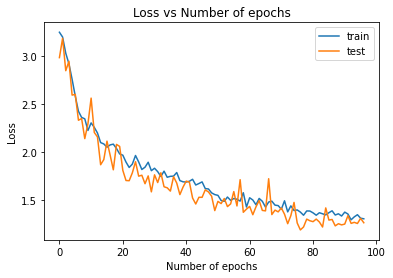

In [33]:
plt.plot(train_losses_unet_feature,label = 'train')
plt.plot(test_losses_unet_feature,label = 'test')
plt.legend()
plt.xlabel("Number of epochs")
plt.ylabel("Loss")
plt.title("Loss vs Number of epochs")
plt.show()

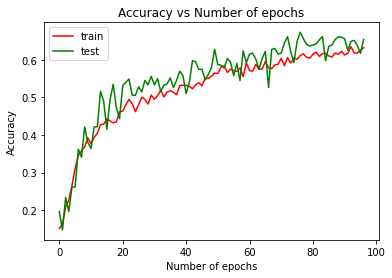

In [34]:
plt.plot(train_accs_unet_feature,label = 'train', color= 'red')
plt.plot(test_accs_unet_feature,label = 'test', color = 'green')
plt.legend()
plt.xlabel("Number of epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Number of epochs")
plt.show()

### Inference

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
pointnet = UNet_PointNet()
pointnet.load_state_dict(torch.load('2unet_early_stop_model.pth'))
pointnet.eval();

In [36]:
all_preds = []
all_labels = []
with torch.no_grad():
    for i, data in enumerate(test_loader):
        print('Batch [%4d / %4d]' % (i+1, len(test_loader)))
                   
        inputs, labels = data['pointcloud'].float(), data['category']
        outputs, __, __ = pointnet(inputs.transpose(1,2))
        _, preds = torch.max(outputs.data, 1)
        all_preds += list(preds.numpy())
        all_labels += list(labels.numpy())

Batch [   1 /  617]
Batch [   2 /  617]
Batch [   3 /  617]
Batch [   4 /  617]
Batch [   5 /  617]
Batch [   6 /  617]
Batch [   7 /  617]
Batch [   8 /  617]
Batch [   9 /  617]
Batch [  10 /  617]
Batch [  11 /  617]
Batch [  12 /  617]
Batch [  13 /  617]
Batch [  14 /  617]
Batch [  15 /  617]
Batch [  16 /  617]
Batch [  17 /  617]
Batch [  18 /  617]
Batch [  19 /  617]
Batch [  20 /  617]
Batch [  21 /  617]
Batch [  22 /  617]
Batch [  23 /  617]
Batch [  24 /  617]
Batch [  25 /  617]
Batch [  26 /  617]
Batch [  27 /  617]
Batch [  28 /  617]
Batch [  29 /  617]
Batch [  30 /  617]
Batch [  31 /  617]
Batch [  32 /  617]
Batch [  33 /  617]
Batch [  34 /  617]
Batch [  35 /  617]
Batch [  36 /  617]
Batch [  37 /  617]
Batch [  38 /  617]
Batch [  39 /  617]
Batch [  40 /  617]
Batch [  41 /  617]
Batch [  42 /  617]
Batch [  43 /  617]
Batch [  44 /  617]
Batch [  45 /  617]
Batch [  46 /  617]
Batch [  47 /  617]
Batch [  48 /  617]
Batch [  49 /  617]
Batch [  50 /  617]


In [48]:
cm = confusion_matrix(all_labels, all_preds);
cm

array([[83,  0,  0, ...,  0,  0,  0],
       [ 1, 38,  0, ...,  0,  0,  0],
       [ 0,  1, 79, ...,  0,  0,  0],
       ...,
       [ 0,  1,  0, ..., 51,  2,  0],
       [ 0,  0,  0, ...,  0,  9,  3],
       [ 0,  1,  2, ...,  0,  1,  9]])

In [49]:
import itertools
import numpy as np
import matplotlib.pyplot as plt

# function from https://deeplizard.com/learn/video/0LhiS6yu2qQ
def plot_confusion_matrix(cm, classes, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

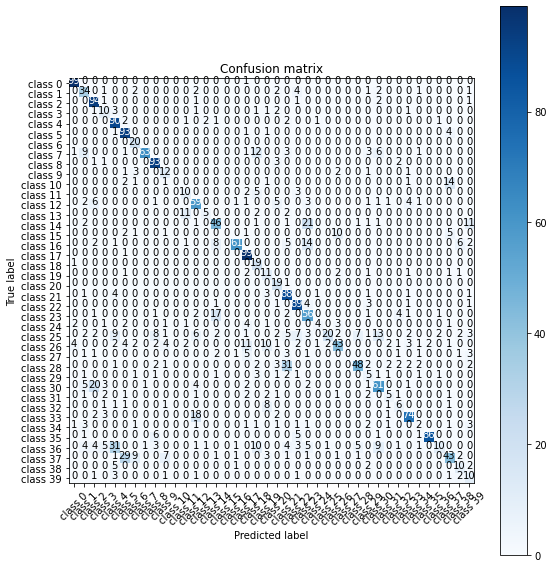

In [42]:
plt.figure(figsize=(8,8))
plot_confusion_matrix(cm, ['class '+str(s) for s in list(range(40))])

In [48]:
from sklearn.metrics import classification_report
# classification report for precision, recall f1-score and accuracy
matrix = classification_report(all_labels, all_preds)
print('Classification report : \n',matrix)

Classification report : 
               precision    recall  f1-score   support

           0       0.93      0.99      0.96       100
           1       0.41      0.82      0.54        50
           2       0.87      0.81      0.84       100
           3       0.37      0.75      0.49        20
           4       0.72      0.82      0.77       100
           5       0.68      0.89      0.77       100
           6       0.51      0.95      0.67        20
           7       0.84      0.76      0.80       100
           8       0.82      0.94      0.87       100
           9       0.33      0.70      0.45        20
          10       0.00      0.00      0.00        20
          11       0.21      0.20      0.21        20
          12       0.81      0.41      0.54        86
          13       0.50      0.80      0.62        20
          14       0.54      0.59      0.57        86
          15       0.00      0.00      0.00        20
          16       0.89      0.54      0.67       100
 

## 2. Change T-Net(in input transform) to U-Net
 
### Model 


In [ ]:
import gc

class conbr_block(nn.Module):
    def __init__(self, in_layer, out_layer):
        super(conbr_block, self).__init__()

        self.conv1 = nn.Conv1d(in_layer, out_layer, 1)
        self.bn = nn.BatchNorm1d(out_layer)
        self.relu = nn.ReLU()
    
    def forward(self,x):
        x = self.conv1(x)
        x = self.bn(x)
        out = self.relu(x)
        
        return out       

class UNET_1D(nn.Module):
    def __init__(self ,input_dim):
        super(UNET_1D, self).__init__()
        self.input_dim = input_dim
        
        self.conv1 = conbr_block(input_dim,64) 
        self.conv2 = conbr_block(64,128) 
        self.conv3 = conbr_block(128,256) 
        self.conv4 = conbr_block(256,512) 
        self.conv5 = conbr_block(512,1024) 

        self.up6 = nn.ConvTranspose1d(1024,512,kernel_size=1)#nn.Upsample() 
        self.conv6 = conbr_block(1024,512) 
        self.up7 = nn.ConvTranspose1d(512,256,kernel_size=1)#nn.Upsample() 
        self.conv7 = conbr_block(512,256) 
        self.up8 = nn.ConvTranspose1d(256,128,kernel_size=1)#nn.Upsample() 
        self.conv8 = conbr_block(256,128) 
        self.up9 = nn.ConvTranspose1d(128,64,kernel_size=1)#nn.Upsample() 
        self.conv9 = conbr_block(128,64) 
        
        #input_dim = k 
        self.outcov = nn.Conv1d(64, input_dim*input_dim , kernel_size=1)

            
    def forward(self, x):               
        #############Encoder#####################
        
        conv1 = self.conv1(x)
        #print(conv1.shape)
        pool1 = F.max_pool1d(conv1,kernel_size=1) #nn.AvgPool1d(conv1)
        #print(pool1.shape)
        
        conv2 = self.conv2(pool1)
        #print(conv2.shape)
        pool2 = F.max_pool1d(conv2,kernel_size=1) #nn.AvgPool1d(conv2) 
        #print(pool2.shape)
        
        conv3 = self.conv3(pool2)
        #print(conv3.shape)
        pool3 = F.max_pool1d(conv3,kernel_size=1) #nn.AvgPool1d(conv3)  
        #print(conv3.shape)
        
        conv4 = self.conv4(pool3)
        #print(conv4.shape)
        pool4 = F.max_pool1d(conv4,kernel_size=1) #nn.AvgPool1d(conv4)  
        #print(conv4.shape)
        
        conv5 = self.conv5(pool4)
        #print(conv5.shape)
        
        #############Decoder####################
        
        up6 = self.up6(conv5)
        up6 = torch.cat([up6, conv4], 1)
        conv6 = self.conv6(up6)
        #print(conv6.shape)
        
        del up6
        del conv4
        del conv5
        
        up7 = self.up7(conv6)
        up7 = torch.cat([up7, conv3], 1)
        conv7 = self.conv7(up7)
        #print(conv7.shape)
        
        del up7
        del conv6
        del conv3
        
        up8 = self.up8(conv7)
        up8 = torch.cat([up8, conv2], 1)
        conv8 = self.conv8(up8)
        #print(conv8.shape)
        
        del up8
        del conv7
        del conv2
        
        up9 = self.up9(conv8)
        up9 = torch.cat([up9, conv1], 1)
        conv9 = self.conv9(up9)   
        #print(conv9.shape)
        
        del up9
        del conv8
        del conv1
        
        out = self.outcov(conv9)
        #print('out : ',out.shape)
        
        del conv9
        gc.collect()
        torch.cuda.empty_cache()
        
        pool = nn.MaxPool1d(out.size(-1))(out)
        flat = nn.Flatten(1)(pool)
        # print('flat :',flat.shape)
        #initialize as identity
        init = torch.eye(self.input_dim, requires_grad=True).repeat(bs,1,1)
        if x.is_cuda:
            init=init.cuda()
        # print('init :',init.shape)
        # print(flat.view(-1,self.input_dim,self.input_dim).shape)
        matrix = flat.view(-1,self.input_dim,self.input_dim) + init
        return matrix

In [ ]:
class Tnet(nn.Module):
    def __init__(self, k=3):
        super().__init__()
        self.k=k
        self.conv1 = nn.Conv1d(k,64,1)
        self.conv2 = nn.Conv1d(64,128,1)
        self.conv3 = nn.Conv1d(128,1024,1)
        self.fc1 = nn.Linear(1024,512)
        self.fc2 = nn.Linear(512,256)
        self.fc3 = nn.Linear(256,k*k)
        self.bn1 = nn.BatchNorm1d(64)
        self.bn2 = nn.BatchNorm1d(128)
        self.bn3 = nn.BatchNorm1d(1024)
        self.bn4 = nn.BatchNorm1d(512)
        self.bn5 = nn.BatchNorm1d(256)
       

    def forward(self, input):
        # input.shape == (bs,n,3)
        bs = input.size(0)
        #print('input : ',input.shape)
        x = F.relu(self.bn1(self.conv1(input)))
        #print('after conv1 : ',x.shape)
        x = F.relu(self.bn2(self.conv2(x)))
        #print('after conv2 : ',x.shape)
        x = F.relu(self.bn3(self.conv3(x)))
        #print('after conv3 : ',x.shape)
        pool = nn.MaxPool1d(x.size(-1))(x)
        #print('after pool : ',pool.shape)
        flat = nn.Flatten(1)(pool)
        #print('after flat : ',flat.shape)
        x = F.relu(self.bn4(self.fc1(flat)))
        #print('after fc1 : ',x.shape)
        x = F.relu(self.bn5(self.fc2(x)))
        #print('after fc2 : ',x.shape)

        #initialize as identity
        init = torch.eye(self.k, requires_grad=True).repeat(bs,1,1)
        if x.is_cuda:
            init=init.cuda()   
        matrix = self.fc3(x).view(-1,self.k,self.k) + init
        #print('fc3 : ',self.fc3(x).shape)
        #print((self.fc3(x).view(-1,self.k,self.k)).shape)
        return matrix



In [ ]:
#Change only input transform T-Net to UNet
import torch
import torch.nn as nn
import numpy as np
import torch.nn.functional as F

class UNet_input_Transform(nn.Module):
    def __init__(self):
        super().__init__()
        self.input_transform = UNET_1D(3) 
        self.feature_transform = Tnet(k=64) 
        self.conv1 = nn.Conv1d(3,64,1)
        self.conv2 = nn.Conv1d(64,128,1)
        self.conv3 = nn.Conv1d(128,1024,1)
        self.bn1 = nn.BatchNorm1d(64)
        self.bn2 = nn.BatchNorm1d(128)
        self.bn3 = nn.BatchNorm1d(1024)
       
    def forward(self, input):
        matrix3x3 = self.input_transform(input) # here, input is of shape (bs,3,n)
        input = torch.transpose(input,1,2)# input is now (bs,n,3)
        # apply input transform (batch matrix multiplication) 
        x = torch.bmm(input, matrix3x3).transpose(1,2)
        x = F.relu(self.bn1(self.conv1(x)))
        
        # similarly for the feature space
        # we apply input transform
        matrix64x64 = self.feature_transform(x)
        x = torch.transpose(x,1,2)
        x = torch.bmm(x, matrix64x64).transpose(1,2)
        x = F.relu(self.bn2(self.conv2(x)))
        x = self.bn3(self.conv3(x))
        x = nn.MaxPool1d(x.size(-1))(x)
        output = nn.Flatten(1)(x)
        return output, matrix3x3, matrix64x64

class UNet_input_PointNet(nn.Module):
    def __init__(self, classes = 40):
        super().__init__()
        self.transform = UNet_input_Transform()
        self.fc1 = nn.Linear(1024, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, classes)    
        self.bn1 = nn.BatchNorm1d(512)
        self.bn2 = nn.BatchNorm1d(256)
        self.dropout = nn.Dropout(p=0.3)
        self.logsoftmax = nn.LogSoftmax(dim=1)

    def forward(self, input):
        x, matrix3x3, matrix64x64 = self.transform(input)
        x = F.relu(self.bn1(self.fc1(x)))
        x = F.relu(self.bn2(self.dropout(self.fc2(x))))
        output = self.logsoftmax(self.fc3(x))
        return output, matrix3x3, matrix64x64

### Training

In [26]:
model = UNet_feature_PointNet()
model.to(device)

UNet_feature_PointNet(
  (transform): UNet_feature_Transform(
    (input_transform): Tnet(
      (conv1): Conv1d(3, 64, kernel_size=(1,), stride=(1,))
      (conv2): Conv1d(64, 128, kernel_size=(1,), stride=(1,))
      (conv3): Conv1d(128, 1024, kernel_size=(1,), stride=(1,))
      (fc1): Linear(in_features=1024, out_features=512, bias=True)
      (fc2): Linear(in_features=512, out_features=256, bias=True)
      (fc3): Linear(in_features=256, out_features=9, bias=True)
      (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn3): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn4): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn5): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (feature_transform): UNET_1D(
      (conv1): c

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=20,gamma=0.5)
early_stopping = EarlyStopping(patience=20, verbose=True)
writer = SummaryWriter('runs/experiment_UNet_input')

In [ ]:
def train(train_loader, test_loader=None,  epochs=15):
    train_losses = []
    test_losses = []
    train_accs = []
    test_accs = []
    
    for epoch in range(epochs): 
        model.train()
        running_loss = 0.0
        av_tr_loss = 0
        train_acc = 0
        for i, data in enumerate(train_loader, 0):
            inputs, labels = data['pointcloud'].to(device).float(), data['category'].type(torch.LongTensor).to(device)
            optimizer.zero_grad()
            outputs, m3x3, m64x64 = model(inputs.transpose(1,2))

            loss = pointnetloss(outputs, labels, m3x3, m64x64)
            loss.backward()
            optimizer.step()
            # scheduler.step()
            
            av_tr_loss += loss.item()
            
            # print statistics
            running_loss += loss.item()
            acc = torch.sum(torch.argmax(outputs.data,dim = 1) == labels)
            train_acc += acc
            if i % 100 == 9:    # print every 10 mini-batches
                    print('[Epoch: %d, Batch: %4d / %4d], loss: %.3f, accuracy: %.2f' %
                        (epoch + 1, i + 1, len(train_loader), running_loss/ 100, 100*acc.item()/labels.size()[0]))
                    running_loss = 0.0

        model.eval()
        correct = total = 0
        av_test_loss = 0
        test_acc = 0
        # validation
        if test_loader:
            with torch.no_grad():
                for data in test_loader:
                    inputs, labels = data['pointcloud'].to(device).float(), data['category'].type(torch.LongTensor).to(device)
                    outputs, m3x3, m64x64 = model(inputs.transpose(1,2))
                    loss_test = pointnetloss(outputs, labels, m3x3, m64x64)
                    av_test_loss += loss_test.item()
                    test_acc += torch.sum(torch.argmax(outputs.data,dim = 1) == labels)
                    _, predicted = torch.max(outputs.data, 1)
                    total += labels.size(0)
                    correct += (predicted == labels).sum().item()
            val_acc = 100. * correct / total
            print('Test accuracy: %d %%' % val_acc)

        writer.add_scalar('Test Loss',av_test_loss/(len(test_ds)//bs),epoch)
        writer.add_scalar('Test acc',test_acc.item()/len(test_ds),epoch)
        writer.add_scalar('Train Loss',av_tr_loss/(len(train_ds)//bs),epoch)
        writer.add_scalar('Train acc',train_acc.item()/len(train_ds),epoch)
        train_losses.append(av_tr_loss/(len(train_ds)//bs))
        test_losses.append(av_test_loss/(len(test_ds)//bs))
        train_accs.append(train_acc.item()/len(train_ds))
        test_accs.append(test_acc.item()/len(test_ds))
        print("TESTING")       
        print("Epoch [{}/{}] --> Testing Loss:{:.3f}, Testing Accuracy:{:.2f}\n".format(epoch+1,epochs,av_test_loss/(len(test_ds)//bs), 100*test_acc.item()/len(test_ds)))
        print("TRAINING")
        print("Epoch [{}/{}] --> Training Loss:{:.3f}, Training Accuracy:{:.2f}\n".format(epoch+1,epochs,av_tr_loss/(len(train_ds)//bs), 100*train_acc.item()/len(train_ds)))
        
        # save the model
        if (epoch+1)%save_every == 0:
            print("SAVING MODEL CHECKPOINT")
            torch.save(model.state_dict(), "baseline_inputTrans_UNet_featureTrans_TNet_ckpt/save_UNet_input"+str(epoch)+".pth")
        
        #end of one epoch
        mean_loss = (av_test_loss/(len(test_ds)//bs))
        early_stopping(mean_loss, model)
        
        if early_stopping.early_stop:
            print("Early stopping")
            torch.save(model.state_dict(), 'UNet_input_early_stop_model.pth')
            break #early stopping applied

    writer.flush()
    return train_losses,test_losses,train_accs,test_accs 

In [ ]:
train_losses_unet_feature,test_losses_unet_feature,train_accs_unet_feature,test_accs_unet_feature=train(train_loader, test_loader, 250)

[Epoch: 1, Batch:   10 / 2460], loss: 0.402, accuracy: 0.00
[Epoch: 1, Batch:  110 / 2460], loss: 3.727, accuracy: 25.00
[Epoch: 1, Batch:  210 / 2460], loss: 3.441, accuracy: 25.00
[Epoch: 1, Batch:  310 / 2460], loss: 3.244, accuracy: 25.00
[Epoch: 1, Batch:  410 / 2460], loss: 3.394, accuracy: 25.00
[Epoch: 1, Batch:  510 / 2460], loss: 3.191, accuracy: 50.00
[Epoch: 1, Batch:  610 / 2460], loss: 3.321, accuracy: 0.00
[Epoch: 1, Batch:  710 / 2460], loss: 3.271, accuracy: 0.00
[Epoch: 1, Batch:  810 / 2460], loss: 3.187, accuracy: 50.00
[Epoch: 1, Batch:  910 / 2460], loss: 3.299, accuracy: 0.00
[Epoch: 1, Batch: 1010 / 2460], loss: 3.288, accuracy: 25.00
[Epoch: 1, Batch: 1110 / 2460], loss: 3.296, accuracy: 0.00
[Epoch: 1, Batch: 1210 / 2460], loss: 3.391, accuracy: 0.00
[Epoch: 1, Batch: 1310 / 2460], loss: 3.303, accuracy: 25.00
[Epoch: 1, Batch: 1410 / 2460], loss: 3.164, accuracy: 0.00
[Epoch: 1, Batch: 1510 / 2460], loss: 3.200, accuracy: 0.00
[Epoch: 1, Batch: 1610 / 2460], 

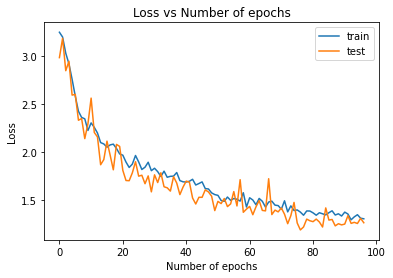

In [33]:
plt.plot(train_losses_unet_feature,label = 'train')
plt.plot(test_losses_unet_feature,label = 'test')
plt.legend()
plt.xlabel("Number of epochs")
plt.ylabel("Loss")
plt.title("Loss vs Number of epochs")
plt.show()

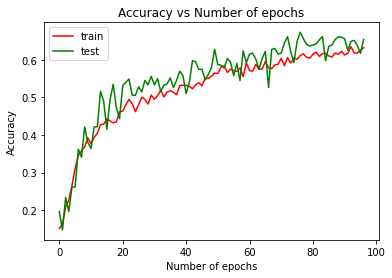

In [34]:
plt.plot(train_accs_unet_feature,label = 'train', color= 'red')
plt.plot(test_accs_unet_feature,label = 'test', color = 'green')
plt.legend()
plt.xlabel("Number of epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Number of epochs")
plt.show()

### Inference

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
pointnet = UNet_input_PointNet()
pointnet.load_state_dict(torch.load('UNet_input_early_stop_model.pth'))
pointnet.eval();

In [ ]:
bs=4
train_loader = DataLoader(dataset=train_ds, batch_size=4, shuffle=True)
test_loader = DataLoader(dataset=test_ds, batch_size=4)

In [36]:
all_preds = []
all_labels = []
with torch.no_grad():
    for i, data in enumerate(test_loader):
        print('Batch [%4d / %4d]' % (i+1, len(test_loader)))
                   
        inputs, labels = data['pointcloud'].float(), data['category']
        outputs, __, __ = pointnet(inputs.transpose(1,2))
        _, preds = torch.max(outputs.data, 1)
        all_preds += list(preds.numpy())
        all_labels += list(labels.numpy())

Batch [   1 /  617]
Batch [   2 /  617]
Batch [   3 /  617]
Batch [   4 /  617]
Batch [   5 /  617]
Batch [   6 /  617]
Batch [   7 /  617]
Batch [   8 /  617]
Batch [   9 /  617]
Batch [  10 /  617]
Batch [  11 /  617]
Batch [  12 /  617]
Batch [  13 /  617]
Batch [  14 /  617]
Batch [  15 /  617]
Batch [  16 /  617]
Batch [  17 /  617]
Batch [  18 /  617]
Batch [  19 /  617]
Batch [  20 /  617]
Batch [  21 /  617]
Batch [  22 /  617]
Batch [  23 /  617]
Batch [  24 /  617]
Batch [  25 /  617]
Batch [  26 /  617]
Batch [  27 /  617]
Batch [  28 /  617]
Batch [  29 /  617]
Batch [  30 /  617]
Batch [  31 /  617]
Batch [  32 /  617]
Batch [  33 /  617]
Batch [  34 /  617]
Batch [  35 /  617]
Batch [  36 /  617]
Batch [  37 /  617]
Batch [  38 /  617]
Batch [  39 /  617]
Batch [  40 /  617]
Batch [  41 /  617]
Batch [  42 /  617]
Batch [  43 /  617]
Batch [  44 /  617]
Batch [  45 /  617]
Batch [  46 /  617]
Batch [  47 /  617]
Batch [  48 /  617]
Batch [  49 /  617]
Batch [  50 /  617]


In [48]:
cm = confusion_matrix(all_labels, all_preds);
cm

array([[83,  0,  0, ...,  0,  0,  0],
       [ 1, 38,  0, ...,  0,  0,  0],
       [ 0,  1, 79, ...,  0,  0,  0],
       ...,
       [ 0,  1,  0, ..., 51,  2,  0],
       [ 0,  0,  0, ...,  0,  9,  3],
       [ 0,  1,  2, ...,  0,  1,  9]])

In [49]:
import itertools
import numpy as np
import matplotlib.pyplot as plt

# function from https://deeplizard.com/learn/video/0LhiS6yu2qQ
def plot_confusion_matrix(cm, classes, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

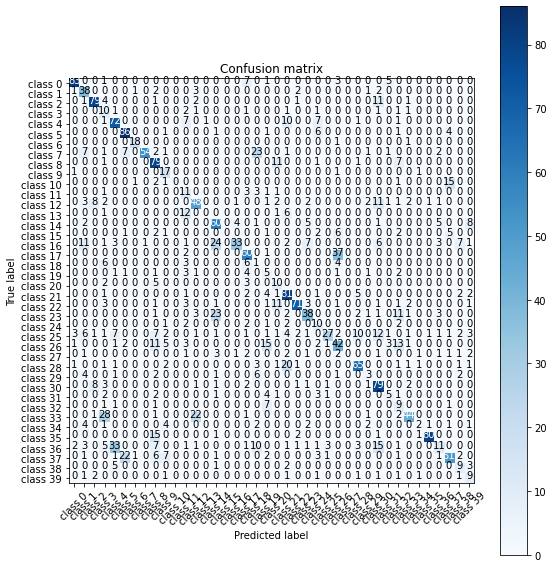

In [53]:
plt.figure(figsize=(8,8))
plot_confusion_matrix(cm, ['class '+str(s) for s in list(range(40))])

In [48]:
from sklearn.metrics import classification_report
# classification report for precision, recall f1-score and accuracy
matrix = classification_report(all_labels, all_preds)
print('Classification report : \n',matrix)

Classification report : 
               precision    recall  f1-score   support

           0       0.93      0.99      0.96       100
           1       0.41      0.82      0.54        50
           2       0.87      0.81      0.84       100
           3       0.37      0.75      0.49        20
           4       0.72      0.82      0.77       100
           5       0.68      0.89      0.77       100
           6       0.51      0.95      0.67        20
           7       0.84      0.76      0.80       100
           8       0.82      0.94      0.87       100
           9       0.33      0.70      0.45        20
          10       0.00      0.00      0.00        20
          11       0.21      0.20      0.21        20
          12       0.81      0.41      0.54        86
          13       0.50      0.80      0.62        20
          14       0.54      0.59      0.57        86
          15       0.00      0.00      0.00        20
          16       0.89      0.54      0.67       100
 

## 3. Change T-Net(in feature transform) to U-Net
 
### Model 


In [ ]:
import gc

class conbr_block(nn.Module):
    def __init__(self, in_layer, out_layer):
        super(conbr_block, self).__init__()

        self.conv1 = nn.Conv1d(in_layer, out_layer, 1)
        self.bn = nn.BatchNorm1d(out_layer)
        self.relu = nn.ReLU()
    
    def forward(self,x):
        x = self.conv1(x)
        x = self.bn(x)
        out = self.relu(x)
        
        return out       

class UNET_1D(nn.Module):
    def __init__(self ,input_dim):
        super(UNET_1D, self).__init__()
        self.input_dim = input_dim
        
        self.conv1 = conbr_block(input_dim,64) 
        self.conv2 = conbr_block(64,128) 
        self.conv3 = conbr_block(128,256) 
        self.conv4 = conbr_block(256,512) 
        self.conv5 = conbr_block(512,1024) 

        self.up6 = nn.ConvTranspose1d(1024,512,kernel_size=1)#nn.Upsample() 
        self.conv6 = conbr_block(1024,512) 
        self.up7 = nn.ConvTranspose1d(512,256,kernel_size=1)#nn.Upsample() 
        self.conv7 = conbr_block(512,256) 
        self.up8 = nn.ConvTranspose1d(256,128,kernel_size=1)#nn.Upsample() 
        self.conv8 = conbr_block(256,128) 
        self.up9 = nn.ConvTranspose1d(128,64,kernel_size=1)#nn.Upsample() 
        self.conv9 = conbr_block(128,64) 
        
        #input_dim = k 
        self.outcov = nn.Conv1d(64, input_dim*input_dim , kernel_size=1)

            
    def forward(self, x):               
        #############Encoder#####################
        
        conv1 = self.conv1(x)
        #print(conv1.shape)
        pool1 = F.max_pool1d(conv1,kernel_size=1) #nn.AvgPool1d(conv1)
        #print(pool1.shape)
        
        conv2 = self.conv2(pool1)
        #print(conv2.shape)
        pool2 = F.max_pool1d(conv2,kernel_size=1) #nn.AvgPool1d(conv2) 
        #print(pool2.shape)
        
        conv3 = self.conv3(pool2)
        #print(conv3.shape)
        pool3 = F.max_pool1d(conv3,kernel_size=1) #nn.AvgPool1d(conv3)  
        #print(conv3.shape)
        
        conv4 = self.conv4(pool3)
        #print(conv4.shape)
        pool4 = F.max_pool1d(conv4,kernel_size=1) #nn.AvgPool1d(conv4)  
        #print(conv4.shape)
        
        conv5 = self.conv5(pool4)
        #print(conv5.shape)
        
        #############Decoder####################
        
        up6 = self.up6(conv5)
        up6 = torch.cat([up6, conv4], 1)
        conv6 = self.conv6(up6)
        #print(conv6.shape)
        
        del up6
        del conv4
        del conv5
        
        up7 = self.up7(conv6)
        up7 = torch.cat([up7, conv3], 1)
        conv7 = self.conv7(up7)
        #print(conv7.shape)
        
        del up7
        del conv6
        del conv3
        
        up8 = self.up8(conv7)
        up8 = torch.cat([up8, conv2], 1)
        conv8 = self.conv8(up8)
        #print(conv8.shape)
        
        del up8
        del conv7
        del conv2
        
        up9 = self.up9(conv8)
        up9 = torch.cat([up9, conv1], 1)
        conv9 = self.conv9(up9)   
        #print(conv9.shape)
        
        del up9
        del conv8
        del conv1
        
        out = self.outcov(conv9)
        #print('out : ',out.shape)
        
        del conv9
        gc.collect()
        torch.cuda.empty_cache()
        
        pool = nn.MaxPool1d(out.size(-1))(out)
        flat = nn.Flatten(1)(pool)
        # print('flat :',flat.shape)
        #initialize as identity
        init = torch.eye(self.input_dim, requires_grad=True).repeat(bs,1,1)
        if x.is_cuda:
            init=init.cuda()
        # print('init :',init.shape)
        # print(flat.view(-1,self.input_dim,self.input_dim).shape)
        matrix = flat.view(-1,self.input_dim,self.input_dim) + init
        return matrix

In [ ]:
class Tnet(nn.Module):
    def __init__(self, k=3):
        super().__init__()
        self.k=k
        self.conv1 = nn.Conv1d(k,64,1)
        self.conv2 = nn.Conv1d(64,128,1)
        self.conv3 = nn.Conv1d(128,1024,1)
        self.fc1 = nn.Linear(1024,512)
        self.fc2 = nn.Linear(512,256)
        self.fc3 = nn.Linear(256,k*k)
        self.bn1 = nn.BatchNorm1d(64)
        self.bn2 = nn.BatchNorm1d(128)
        self.bn3 = nn.BatchNorm1d(1024)
        self.bn4 = nn.BatchNorm1d(512)
        self.bn5 = nn.BatchNorm1d(256)
       

    def forward(self, input):
        # input.shape == (bs,n,3)
        bs = input.size(0)
        #print('input : ',input.shape)
        x = F.relu(self.bn1(self.conv1(input)))
        #print('after conv1 : ',x.shape)
        x = F.relu(self.bn2(self.conv2(x)))
        #print('after conv2 : ',x.shape)
        x = F.relu(self.bn3(self.conv3(x)))
        #print('after conv3 : ',x.shape)
        pool = nn.MaxPool1d(x.size(-1))(x)
        #print('after pool : ',pool.shape)
        flat = nn.Flatten(1)(pool)
        #print('after flat : ',flat.shape)
        x = F.relu(self.bn4(self.fc1(flat)))
        #print('after fc1 : ',x.shape)
        x = F.relu(self.bn5(self.fc2(x)))
        #print('after fc2 : ',x.shape)

        #initialize as identity
        init = torch.eye(self.k, requires_grad=True).repeat(bs,1,1)
        if x.is_cuda:
            init=init.cuda()   
        matrix = self.fc3(x).view(-1,self.k,self.k) + init
        #print('fc3 : ',self.fc3(x).shape)
        #print((self.fc3(x).view(-1,self.k,self.k)).shape)
        return matrix



In [ ]:
#Change only input transform T-Net to UNet
import torch
import torch.nn as nn
import numpy as np
import torch.nn.functional as F

class UNet_feature_Transform(nn.Module):
    def __init__(self):
        super().__init__()
        self.input_transform = Tnet(k=3)
        self.feature_transform = UNET_1D(64) 
        self.conv1 = nn.Conv1d(3,64,1)
        self.conv2 = nn.Conv1d(64,128,1)
        self.conv3 = nn.Conv1d(128,1024,1)
        self.bn1 = nn.BatchNorm1d(64)
        self.bn2 = nn.BatchNorm1d(128)
        self.bn3 = nn.BatchNorm1d(1024)
       
    def forward(self, input):
        matrix3x3 = self.input_transform(input) # here, input is of shape (bs,3,n)
        input = torch.transpose(input,1,2)# input is now (bs,n,3)
        # apply input transform (batch matrix multiplication) 
        x = torch.bmm(input, matrix3x3).transpose(1,2)
        x = F.relu(self.bn1(self.conv1(x)))
        
        # similarly for the feature space
        # we apply input transform
        matrix64x64 = self.feature_transform(x)
        x = torch.transpose(x,1,2)
        x = torch.bmm(x, matrix64x64).transpose(1,2)
        x = F.relu(self.bn2(self.conv2(x)))
        x = self.bn3(self.conv3(x))
        x = nn.MaxPool1d(x.size(-1))(x)
        output = nn.Flatten(1)(x)
        return output, matrix3x3, matrix64x64

class UNet_feature_PointNet(nn.Module):
    def __init__(self, classes = 40):
        super().__init__()
        self.transform = UNet_feature_Transform()
        self.fc1 = nn.Linear(1024, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, classes)    
        self.bn1 = nn.BatchNorm1d(512)
        self.bn2 = nn.BatchNorm1d(256)
        self.dropout = nn.Dropout(p=0.3)
        self.logsoftmax = nn.LogSoftmax(dim=1)

    def forward(self, input):
        x, matrix3x3, matrix64x64 = self.transform(input)
        x = F.relu(self.bn1(self.fc1(x)))
        x = F.relu(self.bn2(self.dropout(self.fc2(x))))
        output = self.logsoftmax(self.fc3(x))
        return output, matrix3x3, matrix64x64

### Training

In [26]:
model = UNet_feature_PointNet()
model.to(device)

UNet_feature_PointNet(
  (transform): UNet_feature_Transform(
    (input_transform): Tnet(
      (conv1): Conv1d(3, 64, kernel_size=(1,), stride=(1,))
      (conv2): Conv1d(64, 128, kernel_size=(1,), stride=(1,))
      (conv3): Conv1d(128, 1024, kernel_size=(1,), stride=(1,))
      (fc1): Linear(in_features=1024, out_features=512, bias=True)
      (fc2): Linear(in_features=512, out_features=256, bias=True)
      (fc3): Linear(in_features=256, out_features=9, bias=True)
      (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn3): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn4): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bn5): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (feature_transform): UNET_1D(
      (conv1): c

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
# scheduler = torch.optim.lr_scheduler.StepLR(optimizer,step_size=20,gamma=0.5)
early_stopping = EarlyStopping(patience=20, verbose=True)
writer = SummaryWriter('runs/experiment_UNet_feature')

In [ ]:
def train(train_loader, test_loader=None,  epochs=15):
    train_losses = []
    test_losses = []
    train_accs = []
    test_accs = []
    
    for epoch in range(epochs): 
        model.train()
        running_loss = 0.0
        av_tr_loss = 0
        train_acc = 0
        for i, data in enumerate(train_loader, 0):
            inputs, labels = data['pointcloud'].to(device).float(), data['category'].type(torch.LongTensor).to(device)
            optimizer.zero_grad()
            outputs, m3x3, m64x64 = model(inputs.transpose(1,2))

            loss = pointnetloss(outputs, labels, m3x3, m64x64)
            loss.backward()
            optimizer.step()
            # scheduler.step()
            
            av_tr_loss += loss.item()
            
            # print statistics
            running_loss += loss.item()
            acc = torch.sum(torch.argmax(outputs.data,dim = 1) == labels)
            train_acc += acc
            if i % 100 == 9:    # print every 10 mini-batches
                    print('[Epoch: %d, Batch: %4d / %4d], loss: %.3f, accuracy: %.2f' %
                        (epoch + 1, i + 1, len(train_loader), running_loss/ 100, 100*acc.item()/labels.size()[0]))
                    running_loss = 0.0

        model.eval()
        correct = total = 0
        av_test_loss = 0
        test_acc = 0
        # validation
        if test_loader:
            with torch.no_grad():
                for data in test_loader:
                    inputs, labels = data['pointcloud'].to(device).float(), data['category'].type(torch.LongTensor).to(device)
                    outputs, m3x3, m64x64 = model(inputs.transpose(1,2))
                    loss_test = pointnetloss(outputs, labels, m3x3, m64x64)
                    av_test_loss += loss_test.item()
                    test_acc += torch.sum(torch.argmax(outputs.data,dim = 1) == labels)
                    _, predicted = torch.max(outputs.data, 1)
                    total += labels.size(0)
                    correct += (predicted == labels).sum().item()
            val_acc = 100. * correct / total
            print('Test accuracy: %d %%' % val_acc)

        writer.add_scalar('Test Loss',av_test_loss/(len(test_ds)//bs),epoch)
        writer.add_scalar('Test acc',test_acc.item()/len(test_ds),epoch)
        writer.add_scalar('Train Loss',av_tr_loss/(len(train_ds)//bs),epoch)
        writer.add_scalar('Train acc',train_acc.item()/len(train_ds),epoch)
        train_losses.append(av_tr_loss/(len(train_ds)//bs))
        test_losses.append(av_test_loss/(len(test_ds)//bs))
        train_accs.append(train_acc.item()/len(train_ds))
        test_accs.append(test_acc.item()/len(test_ds))
        print("TESTING")       
        print("Epoch [{}/{}] --> Testing Loss:{:.3f}, Testing Accuracy:{:.2f}\n".format(epoch+1,epochs,av_test_loss/(len(test_ds)//bs), 100*test_acc.item()/len(test_ds)))
        print("TRAINING")
        print("Epoch [{}/{}] --> Training Loss:{:.3f}, Training Accuracy:{:.2f}\n".format(epoch+1,epochs,av_tr_loss/(len(train_ds)//bs), 100*train_acc.item()/len(train_ds)))
        
        # save the model
        if (epoch+1)%save_every == 0:
            print("SAVING MODEL CHECKPOINT")
            torch.save(model.state_dict(), "baseline_inputTrans_TNet_featureTrans_UNet_ckpt/save_UNet_feature"+str(epoch)+".pth")
        
        #end of one epoch
        mean_loss = (av_test_loss/(len(test_ds)//bs))
        early_stopping(mean_loss, model)
        
        if early_stopping.early_stop:
            print("Early stopping")
            torch.save(model.state_dict(), 'UNet_feature_early_stop_model.pth')
            break #early stopping applied

    writer.flush()
    return train_losses,test_losses,train_accs,test_accs 

In [ ]:
bs=4
train_loader = DataLoader(dataset=train_ds, batch_size=4, shuffle=True)
test_loader = DataLoader(dataset=test_ds, batch_size=4)

In [ ]:
train_losses_unet_feature,test_losses_unet_feature,train_accs_unet_feature,test_accs_unet_feature=train(train_loader, test_loader, 250)

[Epoch: 1, Batch:   10 / 2460], loss: 0.402, accuracy: 0.00
[Epoch: 1, Batch:  110 / 2460], loss: 3.727, accuracy: 25.00
[Epoch: 1, Batch:  210 / 2460], loss: 3.441, accuracy: 25.00
[Epoch: 1, Batch:  310 / 2460], loss: 3.244, accuracy: 25.00
[Epoch: 1, Batch:  410 / 2460], loss: 3.394, accuracy: 25.00
[Epoch: 1, Batch:  510 / 2460], loss: 3.191, accuracy: 50.00
[Epoch: 1, Batch:  610 / 2460], loss: 3.321, accuracy: 0.00
[Epoch: 1, Batch:  710 / 2460], loss: 3.271, accuracy: 0.00
[Epoch: 1, Batch:  810 / 2460], loss: 3.187, accuracy: 50.00
[Epoch: 1, Batch:  910 / 2460], loss: 3.299, accuracy: 0.00
[Epoch: 1, Batch: 1010 / 2460], loss: 3.288, accuracy: 25.00
[Epoch: 1, Batch: 1110 / 2460], loss: 3.296, accuracy: 0.00
[Epoch: 1, Batch: 1210 / 2460], loss: 3.391, accuracy: 0.00
[Epoch: 1, Batch: 1310 / 2460], loss: 3.303, accuracy: 25.00
[Epoch: 1, Batch: 1410 / 2460], loss: 3.164, accuracy: 0.00
[Epoch: 1, Batch: 1510 / 2460], loss: 3.200, accuracy: 0.00
[Epoch: 1, Batch: 1610 / 2460], 

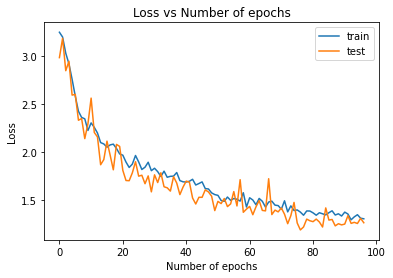

In [33]:
plt.plot(train_losses_unet_feature,label = 'train')
plt.plot(test_losses_unet_feature,label = 'test')
plt.legend()
plt.xlabel("Number of epochs")
plt.ylabel("Loss")
plt.title("Loss vs Number of epochs")
plt.show()

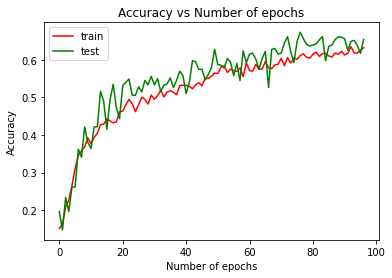

In [34]:
plt.plot(train_accs_unet_feature,label = 'train', color= 'red')
plt.plot(test_accs_unet_feature,label = 'test', color = 'green')
plt.legend()
plt.xlabel("Number of epochs")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Number of epochs")
plt.show()

### Inference

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
pointnet = UNet_feature_PointNet()
pointnet.load_state_dict(torch.load('UNet_feature_early_stop_model.pth'))
pointnet.eval();

In [36]:
all_preds = []
all_labels = []
with torch.no_grad():
    for i, data in enumerate(test_loader):
        print('Batch [%4d / %4d]' % (i+1, len(test_loader)))
                   
        inputs, labels = data['pointcloud'].float(), data['category']
        outputs, __, __ = pointnet(inputs.transpose(1,2))
        _, preds = torch.max(outputs.data, 1)
        all_preds += list(preds.numpy())
        all_labels += list(labels.numpy())

Batch [   1 /  617]
Batch [   2 /  617]
Batch [   3 /  617]
Batch [   4 /  617]
Batch [   5 /  617]
Batch [   6 /  617]
Batch [   7 /  617]
Batch [   8 /  617]
Batch [   9 /  617]
Batch [  10 /  617]
Batch [  11 /  617]
Batch [  12 /  617]
Batch [  13 /  617]
Batch [  14 /  617]
Batch [  15 /  617]
Batch [  16 /  617]
Batch [  17 /  617]
Batch [  18 /  617]
Batch [  19 /  617]
Batch [  20 /  617]
Batch [  21 /  617]
Batch [  22 /  617]
Batch [  23 /  617]
Batch [  24 /  617]
Batch [  25 /  617]
Batch [  26 /  617]
Batch [  27 /  617]
Batch [  28 /  617]
Batch [  29 /  617]
Batch [  30 /  617]
Batch [  31 /  617]
Batch [  32 /  617]
Batch [  33 /  617]
Batch [  34 /  617]
Batch [  35 /  617]
Batch [  36 /  617]
Batch [  37 /  617]
Batch [  38 /  617]
Batch [  39 /  617]
Batch [  40 /  617]
Batch [  41 /  617]
Batch [  42 /  617]
Batch [  43 /  617]
Batch [  44 /  617]
Batch [  45 /  617]
Batch [  46 /  617]
Batch [  47 /  617]
Batch [  48 /  617]
Batch [  49 /  617]
Batch [  50 /  617]


In [41]:
cm = confusion_matrix(all_labels, all_preds);
cm

array([[99,  0,  0, ...,  0,  0,  0],
       [ 0, 41,  0, ...,  0,  0,  0],
       [ 0,  2, 81, ...,  0,  0,  0],
       ...,
       [ 0,  1,  0, ..., 34,  2,  0],
       [ 0,  0,  0, ...,  0,  9,  2],
       [ 0,  1,  2, ...,  0,  2,  9]])

In [ ]:
import itertools
import numpy as np
import matplotlib.pyplot as plt

# function from https://deeplizard.com/learn/video/0LhiS6yu2qQ
def plot_confusion_matrix(cm, classes, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

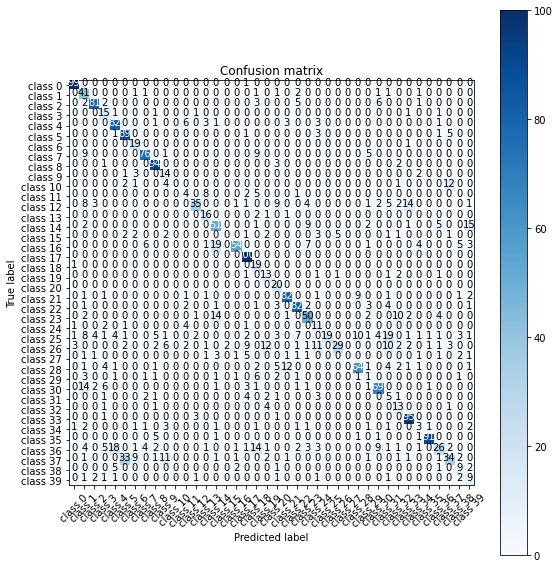

In [43]:
plt.figure(figsize=(8,8))
plot_confusion_matrix(cm, ['class '+str(s) for s in list(range(40))])

In [48]:
from sklearn.metrics import classification_report
# classification report for precision, recall f1-score and accuracy
matrix = classification_report(all_labels, all_preds)
print('Classification report : \n',matrix)

Classification report : 
               precision    recall  f1-score   support

           0       0.93      0.99      0.96       100
           1       0.41      0.82      0.54        50
           2       0.87      0.81      0.84       100
           3       0.37      0.75      0.49        20
           4       0.72      0.82      0.77       100
           5       0.68      0.89      0.77       100
           6       0.51      0.95      0.67        20
           7       0.84      0.76      0.80       100
           8       0.82      0.94      0.87       100
           9       0.33      0.70      0.45        20
          10       0.00      0.00      0.00        20
          11       0.21      0.20      0.21        20
          12       0.81      0.41      0.54        86
          13       0.50      0.80      0.62        20
          14       0.54      0.59      0.57        86
          15       0.00      0.00      0.00        20
          16       0.89      0.54      0.67       100
 

## 4. Implement of weighted Cross Entropy Loss in baseline model


In [ ]:
#way 1
#weighted CE loss
#https://discuss.pytorch.org/t/weights-in-weighted-loss-nn-crossentropyloss/69514
#this method training the weigths of the loss as well 


In [ ]:
# Create weight tensor for weighted nn.CrossEntropyLoss
weights = torch.tensor(weight_list, dtype=torch.float32)
weights = weights / weights.sum()
print(weights)
#normalize the weights proportionnally to the reverse of the initial weights (so the more examples a class has in the training data, the smaller the weight it has in the loss).
weights = 1.0 / weights
weights = weights / weights.sum()
print(weights)
class_weights = torch.FloatTensor(weights).cuda()
Criterion = nn.CrossEntropyLoss(weight=class_weights)#to replace the torch.nn.NLLLoss() criteron in pointnetloss() and remove softmax in last layer of PointNet()

In [ ]:
#way 2
#way 2 to create weight tensor for weighted CE loss is similar as way1, but more comprehensible
#and both get very close overall accuracy results by a difference of weighted CE loss
#since way 2 give slightly higher overall accuracy score, only way 2 formula and results are written in the report.
#formula get from https://ai.stackexchange.com/questions/20249/how-are-weights-for-weighted-x-entropy-loss-on-imbalanced-data-calculated

class_list = df['Class'].tolist()
freq_list = df['count'].tolist()

# Create weight tensor for weighted nn.CrossEntropyLoss
weight_list=[]
for i in range(40):
    weight_for_a_class = (1 / freq_list[i]) * len(train_labels)/40
    weight_list.append(weight_for_a_class)

weights = torch.tensor(weight_list, dtype=torch.float32)
print(weights)
class_weights = torch.FloatTensor(weights).cuda()
Criterion = nn.CrossEntropyLoss(weight=class_weights) # to replace the torch.nn.NLLLoss() criteron in pointnetloss() and remove softmax in last layer of PointNet

## 5. Resampling data(Undersampling) in baseline model
 

In [ ]:
#undersampling to counter imbalanced dataset
#1. Filter the file_idxs first from the labels.npy
unique_cloud_idx1 = [(train_labels.tolist()).index(i) for i in range(40)]
file_idxs=[]
for i in range(40):
    file_idxs.append([j for j, e in enumerate(train_labels.tolist()) if e == i])#append the list of file indexs for each class,from class 0 to class 39


In [ ]:
#file_idxs is a list where every element is a list of file indexs for each class
#For undersampling, the minimum number of occurances is 64 from classs 6.
#2. Take only the first 64 occurances for each class by truncate list of file indexs for each class in file_idxs to the length of 64.
truncated_file_idxs=[]
for e in file_idxs:
    truncated_file_idxs.append(e[0 : 64])

In [ ]:
import itertools
#the final file_idxs for the undersampling
undersampling_file_idxs=(list(itertools.chain.from_iterable(truncated_file_idxs)))   
undersampling_file_idxs

In [ ]:
#3. Create new numpy for point cloud object and label respectively using the truncated_file_idxs
ori_train_points = np.load('train/coors.npy')
ori_train_labels= np.load('train/labels.npy')
#4. form undersampling dataset (will be shuffle by dataloader during dataloading)
undersampling_train_points= ori_train_points[undersampling_file_idxs,:,:]
undersampling_train_labels= ori_train_labels[undersampling_file_idxs]

In [ ]:
#5. Save the resampled numpy data to npy 
np.save('undersampling_coors.npy', undersampling_train_points)
np.save('undersampling_labels.npy', undersampling_train_labels)

## 6. Data Augmentation(Shuffle) in baseline model



(2048, 3)


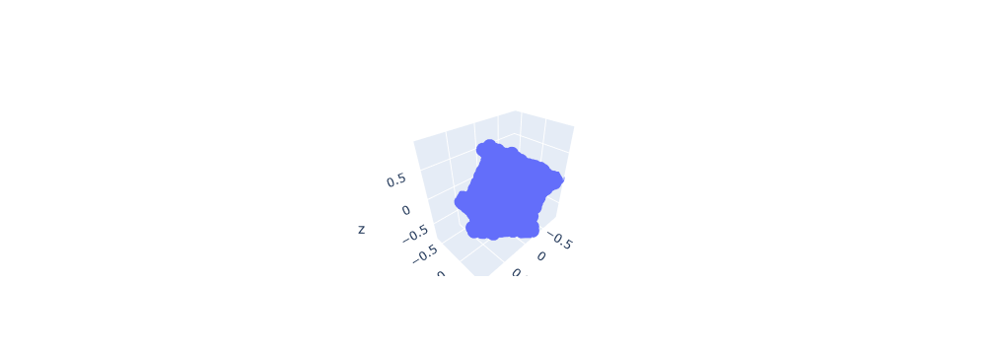

In [26]:
#shuffle the point cloud data
'''
    This function only shuffles the array along the first axis of a multi-dimensional array. 
    The order of sub-arrays is changed but their contents remains the same.
'''
class shuffle(object):
    def __call__(self, pointcloud):
        assert len(pointcloud.shape)==2
        
        np.random.shuffle(pointcloud)
        shuffle_pointcloud = pointcloud
        return shuffle_pointcloud

    
shuffle_noisy_rot_pointcloud = shuffle()(noisy_rot_pointcloud)#(train_points[1023]) 
print(shuffle_noisy_rot_pointcloud.shape) 
fig=go.Figure(data=[go.Scatter3d(x=shuffle_noisy_rot_pointcloud[:,0],y=shuffle_noisy_rot_pointcloud[:,2],z=shuffle_noisy_rot_pointcloud[:,1],mode='markers')])
fig.show()

# Visualize The Predictions

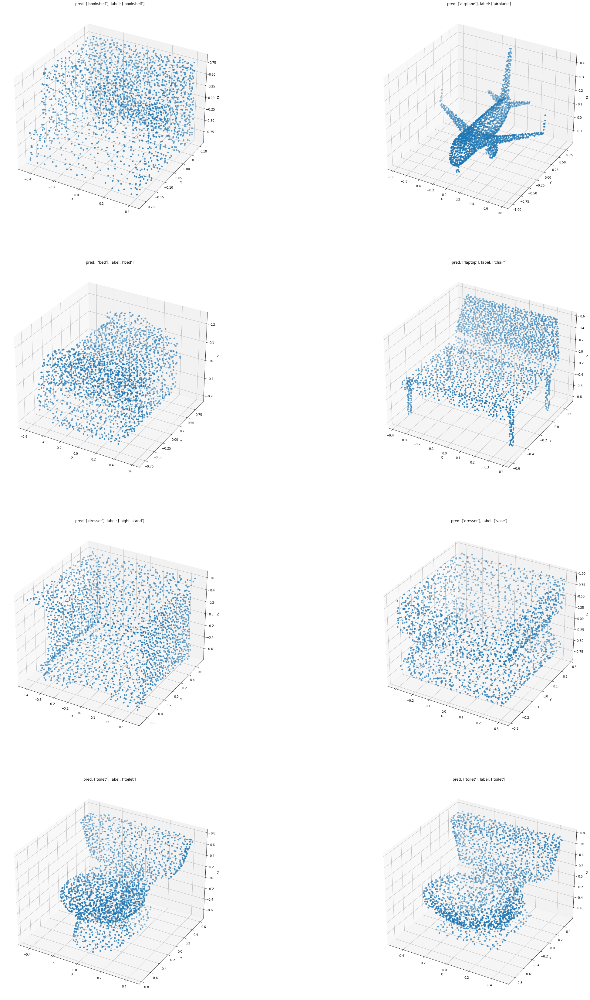

In [67]:
test_points = np.load('test/coors.npy')
test_labels= np.load('test/labels.npy')
#visualise the first 8 test prediction
f, axs = plt.subplots(4,2,figsize=(40,60))
for i in range(8):
    # coordinates
    x = test_points[i, :,0]
    y = test_points[i,:, 2]
    z = test_points[i,:, 1]
    ax = plt.subplot(4,2,i+1,projection='3d')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(
    "pred: {:}, label: {:}".format(
        CLASS_MAP[all_preds[i]], CLASS_MAP[all_labels[i]]
    ))
    ax.scatter(x, y, z, cmap=plt.hot())
    # ax.set_axis_off()

plt.show()